In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit"
value="Click here to toggle on/off the raw code."></form>''')

#### Click Button On Top To Show Code

In [2]:
from IPython.core.display import HTML
from IPython.display import Image
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

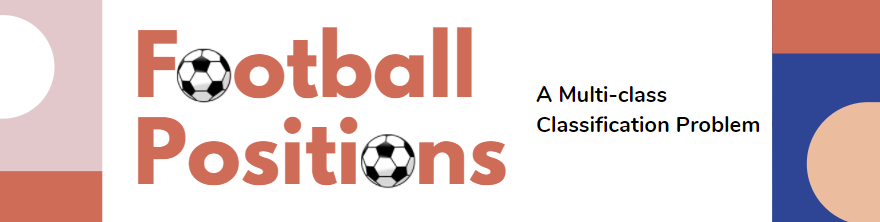

In [3]:
Image(filename="banner.jpg")

# Football Positions: A Multi-class Classification Problem

In [6]:
# import packages
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import re
import string

from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.utils import shuffle
from sklearn.metrics import recall_score,precision_score,f1_score

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import plot_confusion_matrix

from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

from imblearn.over_sampling import SVMSMOTE
from collections import Counter
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

from collections import Counter
from numpy import log

## Introduction

`Football` is arguably the most famous sport with a global following of approximately 3.5 to 4 billion fans, and has the highest television audience in sports worldwide. It is a sport played with 11 players per team, each with a particular designation. In this study, the players are classified into 8 different position classes which are determined by the difference in roles and location of play inside the field. 

These classes are Forwards (FW), Wide Players (WD), Attacking Midfielders (AM), Midfielders (MF), Defensive Midfielders (DM), Centerbacks (CB), Fullbacks (FB) and Goalkeepers.

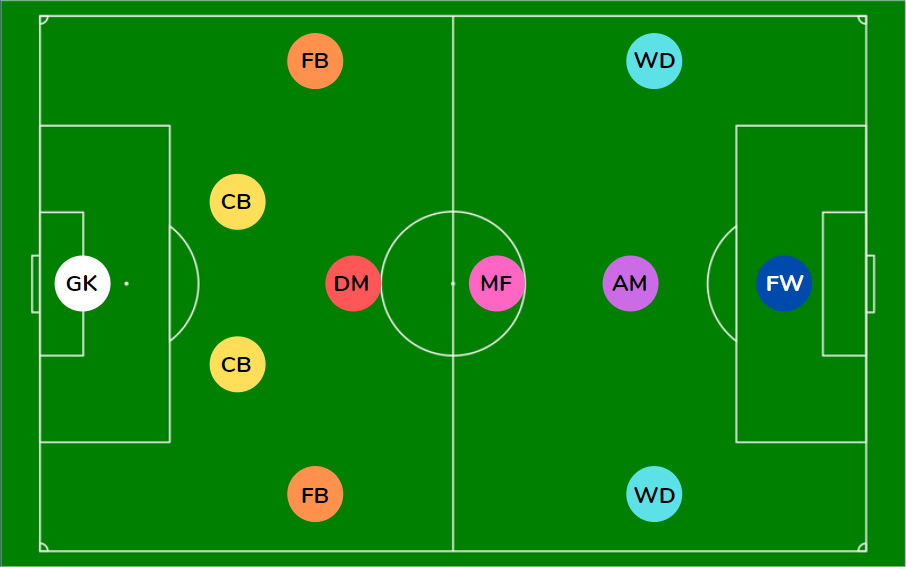

In [5]:
Image(filename="field.jpg")

## Highlights

- `Shannon Entropy balance` can be used to determine the imbalance of a multi-class dataset.
<br>

- `Cost sensitive` parameters like class weight can be used instead of sampling to address imbalance.
<br>

- In this study, `LIME` method was more helpful in showing the local interpretability of the results.
<br>

- Seeing the other possibilities for each class help establish the related positions with each other.
<br>

- `Ability improvement` and `position shift` are some of the insights that can be derived from the study.
<br>

## Data Preparation

The dataset consisted of players from the `FIFA22` player database. Players from the top 5 European leagues were included in this study. These leagues are the `English Premier League`, `Spanish La Liga`, `French Ligue 1`, `Italian Serie A` and the `German Bundesliga 1`. 

After filtering, 35 features were selected corresponding to different player abilities except for `goalkeeping` abilities. Each player has one or more corresponding position label, but for this study, the main player position was used as the official label and target variable. `Goalkeepers` were also excluded from the dataset because they were easily identifiable as they use a different set of player abilities. A total of 2650 players were used as our final data set.

After this, the player positions were reduced into 7 main categories: `Forwards (FW)`, `Wide Player (WD)`, `Midfielders (MF)`, `Attacking Midfielder (AM)`, `Defensive Midfielder (DM)`, `Centerback (CB)` and `Fullback (FB)`.



In [7]:
# load dataset
df = pd.read_csv("players_22.csv")

# filter per league
league_list = ('English Premier League', 'Spain Primera Division',
               'German 1. Bundesliga', 'French Ligue 1', 'Italian Serie A')

df = df[df["league_name"].isin(league_list)]

In [8]:
df_new = df.copy()

# filter player abilities used as features
columns = ['crossing', 'finishing', 'heading', 
           'short_pass', 'volleys', 'shooting',
           'dribbling','ball_ctrl', 'curve', 'dribbling', 
           'fk_acc','acceleration', 'agility', 
           'balance', 'reactions', 'sprint','pace', 
           'defending', 'marking', 'sld_tkl', 
           'std_tkl','passing','aggression', 
           'composure', 'interceptions', 'penalties',
           'positioning', 'vision','physic', 'jumping', 
           'long_shots', 'shot_pwr', 'stamina', 'strength',  
           'long_pass','player_positions']

df_new = df_new[columns]

In [9]:
# choose primary player position as label/target
df_new['player_positions'] = (df_new['player_positions']
                              .str.strip().replace(',','', regex=True))
df_new['player_positions'] = df_new.player_positions.str.split().str.get(0)

# removing goalkeepers
df_new = df_new[df_new['player_positions'] != 'GK']

# susbsitute all empty value with zero
df_new=df_new.fillna(0)

In [10]:
forward_player = ["ST", "LF", "RF", "RS","LS", "CF"]
wide_player = ["LW", "RW", "RM", "LM"]
midfielder_player = ["CM","RCM","LCM"]
attackmid_player = ["CAM", "LAM", "RAM"]
defmid_player = ["CDM","RDM","LDM"]
centerback_player = ["CB", "RCB", "LCB"]
fullback_player = [ "LWB", "RWB", "LB", "RB"]

# create 7 main position groups
df_new.loc[df_new["player_positions"].isin(forward_player), 
           "player_positions"] = 'FW'
df_new.loc[df_new["player_positions"].isin(wide_player), 
           "player_positions"] = 'WD'
df_new.loc[df_new["player_positions"].isin(midfielder_player), 
           "player_positions"] = 'MF'
df_new.loc[df_new["player_positions"].isin(attackmid_player), 
           "player_positions"] = 'AM'
df_new.loc[df_new["player_positions"].isin(defmid_player), 
           "player_positions"] = 'DM'
df_new.loc[df_new["player_positions"].isin(centerback_player), 
           "player_positions"] = 'CB'
df_new.loc[df_new["player_positions"].isin(fullback_player), 
           "player_positions"] = 'FB'

In [11]:
#sample data
df_new.head()

,crossing,finishing,heading,short_pass,volleys,shooting,dribbling,ball_ctrl,curve,dribbling,...,positioning,vision,physic,jumping,long_shots,shot_pwr,stamina,strength,long_pass,player_positions
0,85,95,70,91,88,92.0,95.0,96,93,95.0,...,93,95,65.0,68,94,86,72,69,91,WD
1,71,95,90,85,89,92.0,86.0,88,79,86.0,...,95,81,82.0,85,87,90,76,86,70,FW
2,87,95,90,80,86,94.0,88.0,88,81,88.0,...,95,76,75.0,95,93,94,77,77,77,FW
3,85,83,63,86,86,83.0,94.0,95,88,94.0,...,86,90,63.0,64,81,80,81,53,81,WD
4,94,82,55,94,82,86.0,88.0,91,85,88.0,...,88,94,78.0,63,91,91,89,74,93,MF


## Data Distribution

The data distribution is varying per position with CB having the most samples at 20% and AM at 6.6%. The computed `Proportion Chance Criterion is 15.56%`, with a minimum accuracy set to `19.45%` for the model prediction to be valid.

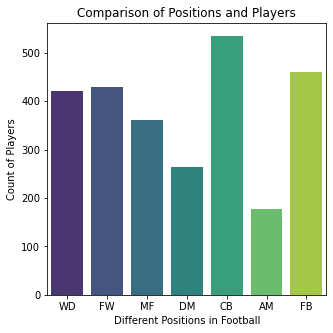

In [12]:
# data distribution

plt.figure(figsize = (5, 5))
ax = sns.countplot('player_positions', data = df_new, palette = 'viridis')
ax.set_xlabel(xlabel = 'Different Positions in Football')
ax.set_ylabel(ylabel = 'Count of Players')
ax.set_title(label = 'Comparison of Positions and Players')
plt.show();

In [13]:
# Check PCC

val_counts = df_new['player_positions'].value_counts()
pcc = sum((val_counts / sum(val_counts))**2) * 1.25

print("Proportion Chance Criterion: {:0.2f}%".format(100*pcc/1.25))
print("1.25 * Proportion Chance Criterion: {:0.2f}%".format(100*pcc))

Proportion Chance Criterion: 15.56%
1.25 * Proportion Chance Criterion: 19.45%


## Feature Engineering

The current feature ratings range from 0 to 100. Some of the newer players will have a tendency of having lower values for these ratings compared to the veteran players. A veteran player may have a "low" rating of 70 for the passing skill but for a newer player, 70 could already be considered as a "high rating".

To address this, the rating values were transformed by dividing the rating value by the total of all rating scores of the same player. This will provide values corrersponding to the percentage that each ability contributes to a player's overall performance. This transformation will determine the profile of the players holistically.

In [14]:
# define X and y
X = df_new.drop("player_positions", axis=1)
y = df_new["player_positions"].values

In [15]:
# transform feature values
X = X.astype(float)
X["sum"] = X.sum(axis=1)
X.iloc[:,:] = X.apply(lambda r: r*100/r['sum'],axis=1).round(2)
X = X.drop('sum', axis=1)

In [16]:
# sample X after transformation
X.head()

,crossing,finishing,heading,short_pass,volleys,shooting,dribbling,ball_ctrl,curve,dribbling,...,penalties,positioning,vision,physic,jumping,long_shots,shot_pwr,stamina,strength,long_pass
0,3.12,3.49,2.57,3.34,3.23,3.38,3.49,3.53,3.42,3.49,...,2.76,3.42,3.49,2.39,2.50,3.45,3.16,2.65,2.53,3.34
1,2.62,3.50,3.32,3.14,3.28,3.39,3.17,3.25,2.91,3.17,...,3.32,3.50,2.99,3.02,3.14,3.21,3.32,2.80,3.17,2.58
2,3.22,3.51,3.33,2.96,3.18,3.48,3.26,3.26,3.00,3.26,...,3.26,3.51,2.81,2.77,3.51,3.44,3.48,2.85,2.85,2.85
3,3.18,3.11,2.36,3.22,3.22,3.11,3.52,3.56,3.30,3.52,...,3.48,3.22,3.37,2.36,2.40,3.03,3.00,3.03,1.99,3.03
4,3.33,2.91,1.95,3.33,2.91,3.05,3.12,3.22,3.01,3.12,...,2.94,3.12,3.33,2.76,2.23,3.22,3.22,3.15,2.62,3.30


## Check Data Imbalance

The varying percentages of the 7 main position groups may imply dataset imbalance and to check whether it is indeed imbalanced or not, I used Shannon Entropy balance as a measure. `Shannon Entropy` can be solved using the formula below with `k` as the number of `classes`, `n` as the `total number of samples` and `c` as the `total per class`.

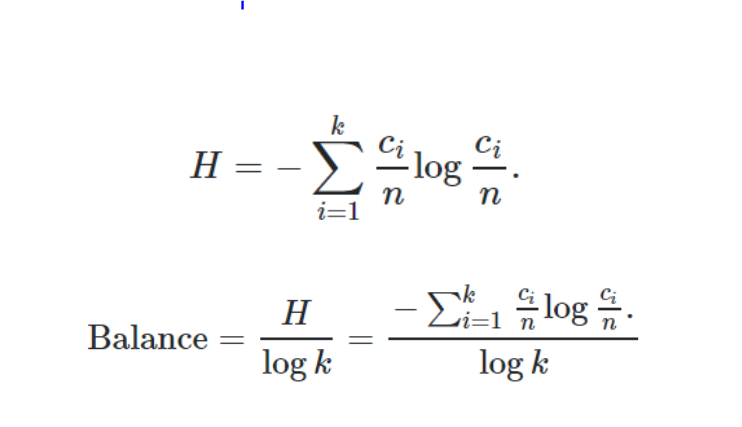

In [17]:
Image(filename="shannon.jpg")

The balance will then be computed by dividing the Shannon entropy value by log of the number of classes. The relative assessment will be 'balanced' if the value is closer to 1 and imbalanced as it gets closer to 0. For our dataset, we got a balance score of 0.97 which means that it is relatively balanced.

In [18]:
def imbalance(seq):
    n = len(seq)
    classes = [(clas,float(count)) for clas,count in Counter(seq).items()]
    k = len(classes)
    
    # Shannon entropy
    H = -sum([ (count/n) * log((count/n)) for clas,count in classes])
    
    return H/log(k) # balance metric

print("Shannon Entropy Balance: %f" % imbalance(y))

Shannon Entropy Balance: 0.974903


## Exploratory Data Analysis

The features' correlation to each other was checked and there is a notable negative correlation found between offense and defense related features (See dark areas).

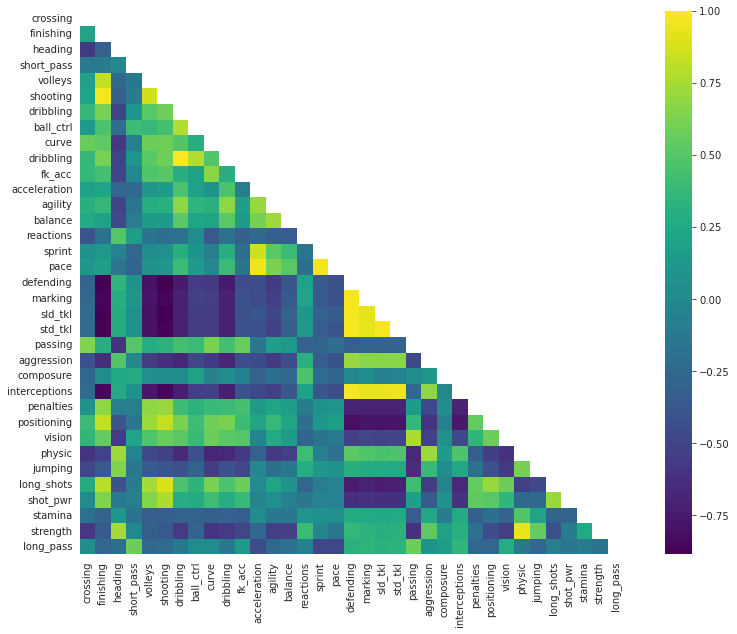

In [19]:
#check feature correlation

corr = X.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 10))
    ax = sns.heatmap(corr, mask=mask, square=True, cmap='viridis')

Some of the assumed offense (finishing, shooting) and defense (physicality, defending) oriented features were checked to see their average values per position. Finishing and shooting were particularly high for the forward class (FW) followed by the wide players (WD) and attacking midfielder (AM). Meanhwile for physicality and defending, the centerback (CB) class registered the highest average followed by the defensive midfielder (DM) class and the fullbacks (FB), all of which are defensive type of roles.

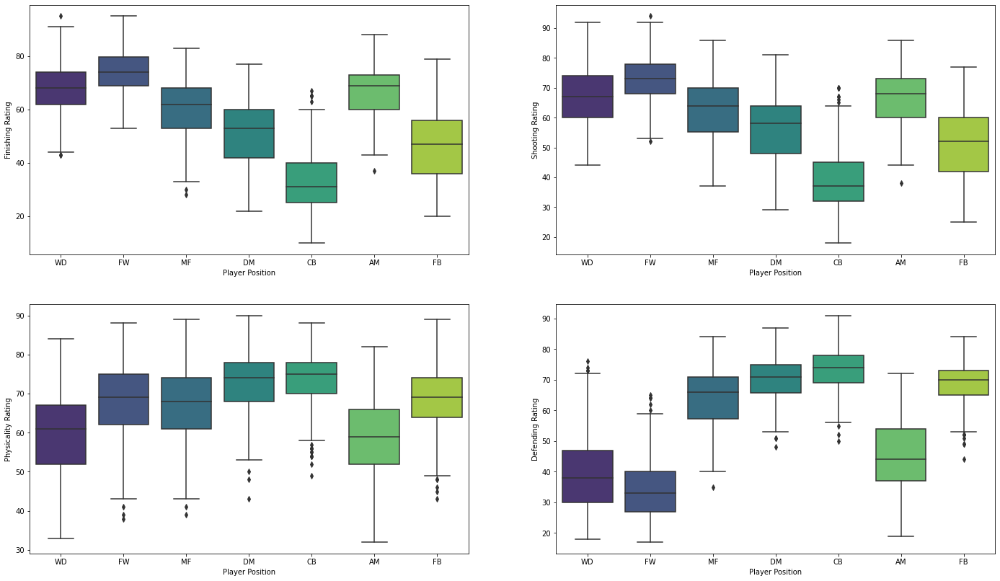

In [20]:
# Attacker and Defender Stats
fig, ax = plt.subplots(2,2, sharey=False, figsize=(24,14))

sns.boxplot(x='player_positions', 
            y='finishing', 
            data = df_new, 
            palette='viridis',
            ax=ax[0][0])

sns.boxplot(x='player_positions', 
            y='shooting', 
            data = df_new, 
            palette='viridis',
            ax=ax[0][1])

sns.boxplot(x='player_positions', 
            y='physic', 
            data = df_new, 
            palette='viridis',
            ax=ax[1][0])

sns.boxplot(x='player_positions', 
            y='defending', 
            data = df_new, 
            palette='viridis',
            ax=ax[1][1])

ax[0][0].set(xlabel='Player Position', ylabel='Finishing Rating')
ax[0][1].set(xlabel='Player Position', ylabel='Shooting Rating')
ax[1][0].set(xlabel='Player Position', ylabel='Physicality Rating')
ax[1][1].set(xlabel='Player Position', ylabel='Defending Rating')
plt.show()

Meanwhile, some of the assumed midfield (passing, ball control) and wide player (vision, crossing) oriented features were also checked to see their average values per position. Crossing is high for the wide player (WD) and fullback (FB) class. Meanwhile vision was high for the wide player (WD) class and the attacking midfielder (AM) class. Passing and ball control was high for the three midfield classes (AM, MF and DM)

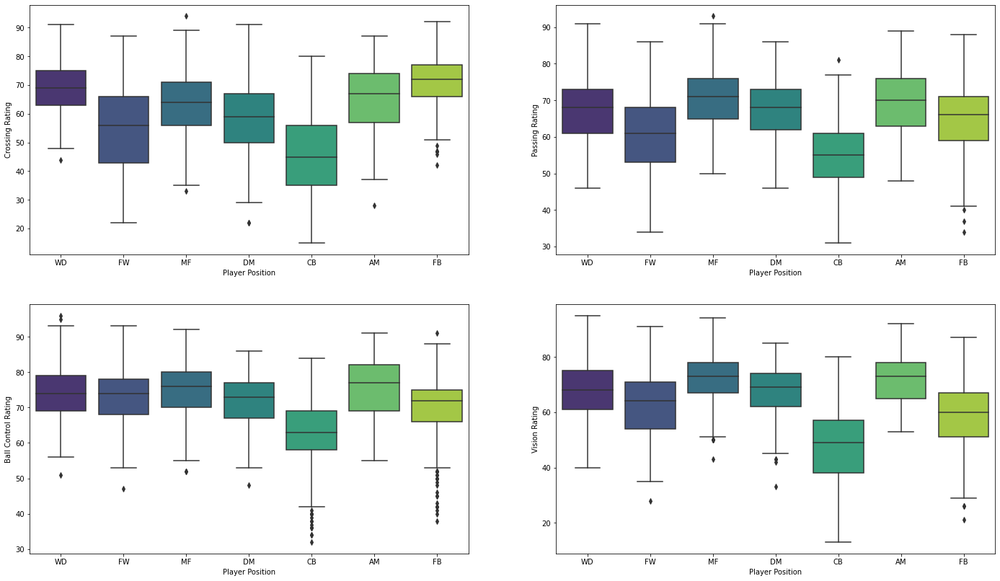

In [21]:
# Midfield and Wide Stats
fig, ax = plt.subplots(2,2, sharey=False, figsize=(24,14))

sns.boxplot(x='player_positions', 
            y='crossing', 
            data = df_new, 
            palette='viridis',
            ax=ax[0][0])

sns.boxplot(x='player_positions', 
            y='passing', 
            data = df_new, 
            palette='viridis',
            ax=ax[0][1])

sns.boxplot(x='player_positions', 
            y='ball_ctrl', 
            data = df_new, 
            palette='viridis',
            ax=ax[1][0])

sns.boxplot(x='player_positions', 
            y='vision', 
            data = df_new, 
            palette='viridis',
            ax=ax[1][1])

ax[0][0].set(xlabel='Player Position', ylabel='Crossing Rating')
ax[0][1].set(xlabel='Player Position', ylabel='Passing Rating')
ax[1][0].set(xlabel='Player Position', ylabel='Ball Control Rating')
ax[1][1].set(xlabel='Player Position', ylabel='Vision Rating')
plt.show()

## Methodology

## Split Data to Train & Holdout Sets

The data was split between a holdout subset and a training subset. The training dataset comprises of 80% of the original data and will be used to train and validate the models. Meanwhile, the holdout subset will be used later on as a final check of the model's performance. This will be a good measure because the model haven't seen this particular subset of data yet.

In [22]:
# divide dataset into test and hold out set
X_train, X_val, Y_train, Y_val = train_test_split(X, y, test_size=0.20, 
                                                  random_state=9, 
                                                  stratify=y)

## Run Models before Sampling

Initial training is done for 6 classifier models using `non-resampled` data, namely: kNN, Logistic Regression, Support Vector, Decision Tree, Random Forest and Gradient Boosting. For the initial results `Logistic Regression`, `Support Vector` and `Random Forest` got the highest accuracy scores. This was done using `cross_val_score` with `stratifiedkFold` as the cross validation technique.

In [23]:
random_state = 17
scoring = 'accuracy'

# define ML models
models = [('kNN Classifier', KNeighborsClassifier()),
          ('Logistic Regression', LogisticRegression()), 
          ('Support Vector Classifier', SVC()), 
          ('Decision Tree Classifier', 
           DecisionTreeClassifier(random_state=random_state)),
          ('Random Forest Classifier', 
           RandomForestClassifier(random_state=random_state)), 
          ('Gradient Boosting Classifier', 
           GradientBoostingClassifier(random_state=random_state))]

In [24]:
# run models, data not resampled
for label, model in models:
    skfold =  StratifiedKFold(n_splits=5, shuffle=True, 
                              random_state=random_state)
    cv_results = cross_val_score(model, X_train, Y_train, 
                                 cv=skfold, scoring=scoring)
    print("%s: %.4f +/- %.2f" % (label, cv_results.mean(), cv_results.std()))

kNN Classifier: 0.7731 +/- 0.01
Logistic Regression: 0.8165 +/- 0.01
Support Vector Classifier: 0.8165 +/- 0.01
Decision Tree Classifier: 0.7047 +/- 0.02
Random Forest Classifier: 0.8057 +/- 0.01
Gradient Boosting Classifier: 0.7981 +/- 0.02


## Oversampling

`SVM SMOTE` was used as the oversampling technique in order to produce equally balanced data.

In [25]:
# transform the dataset
oversample = SVMSMOTE()
X_train_os, Y_train_os = oversample.fit_resample(np.array(X_train), Y_train)

## Run Models after Oversampling

The 6 models were retrained, this time with the `oversampled` data using SVMSMOTE. There is a notable increase for all models. The `Random Forest` is now the model with the highest accuracy followed by `Gradient Boosting` and `Support Vector`.

In [26]:
# run models, oversampled
for label, model in models:
    skfold =  StratifiedKFold(n_splits=5, shuffle=True, 
                              random_state=random_state)
    cv_results = cross_val_score(model, X_train_os, Y_train_os, 
                                 cv=skfold, scoring=scoring)
    print("%s: %.4f +/- %.2f" % (label, cv_results.mean(), cv_results.std()))

kNN Classifier: 0.8141 +/- 0.02
Logistic Regression: 0.8298 +/- 0.01
Support Vector Classifier: 0.8348 +/- 0.01
Decision Tree Classifier: 0.7680 +/- 0.02
Random Forest Classifier: 0.8685 +/- 0.01
Gradient Boosting Classifier: 0.8605 +/- 0.01


## Model Selection

Due to the high accuracy readings for both instances, the following models were selected for further optimization: `Support Vector` and `Random Forest`.

## SVM GridSearch (Non-sampled)

Using grid search, the SVC model was optimized by looking for its best hyperparameter. In this case, the best number of `C` value, type of `kernel` and best value for `gamma` will be checked. An additional parameter called `class_weight` was also checked. This parameter is a `cost sensitive` parameter and is an alternative way of addressing class imbalance. We included it in our optimization for the non-sampled data.

After using grid search, the best hyperparameters chosen were `C=2, kernel=rbf, gamma=scale and class_weight=None`. In this case, balancing the data did not help increase the accuracy. These new parameters improved the accuracy of the model to `82.50%`.

In [27]:
# gridsearch for SVC model
svc = SVC(random_state=random_state)

c_values = [1.0, 2.0, 3.0] #[0.01, 0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
kernel_values = ['rbf', 'linear'] #['linear', 'poly', 'rbf', 'sigmoid']
gamma = ['scale', 'auto'] #['scale', 'auto', 1.0, 0.1, 0.01, 0.001, 0.0001]
weights = ['balanced', None]

param_grid = dict(C=c_values, kernel=kernel_values, gamma=gamma, 
                  class_weight=weights)

skfold = StratifiedKFold(n_splits=5, shuffle=True, 
                         random_state=random_state)

grid_search = GridSearchCV(svc, param_grid, scoring='accuracy', cv=skfold)
svc_result = grid_search.fit(X_train, Y_train)

print("Best Accuracy: %f Best hyperparameter: %s" % (svc_result.best_score_,
                                                     svc_result.best_params_))

Best Accuracy: 0.825000 Best hyperparameter: {'C': 2.0, 'class_weight': None, 'gamma': 'scale', 'kernel': 'rbf'}


Using the best hyperparameters, the model is again trained and then was used to predict the classifications of the holdout dataset. The `holdout accuracy` recorded was `82.26%`. Check the confusion matrix below to see how the prediction went. In this study, it is important to see how many were identified properly and also to see which other classes are mostly mistaken as the other. This is due to the overlapping nature of some of the positions.

In [28]:
# test top hyperparameters on hold out data
svc = SVC(C=2, kernel = 'rbf', random_state=random_state, gamma= 'scale', 
          class_weight = None)
svc.fit(X_train, Y_train)

svc_pred = svc.predict(X_val)

print("Holdout Accuracy: %f" % accuracy_score(Y_val, svc_pred))

Holdout Accuracy: 0.822642


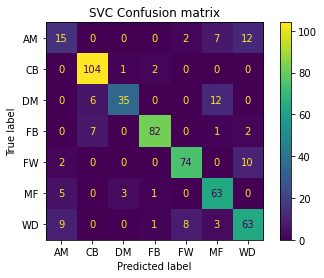

In [29]:
# plot confusion matrix
cm_svc = plot_confusion_matrix(svc, X_val, Y_val,
                               cmap='viridis',
                               normalize=None)

cm_svc.ax_.set_title('SVC Confusion matrix');

## RF GridSearch (Unsampled)

Using grid search, the RF model was optimized by looking for its best hyperparameter. In this case, the best number of `n_estimators` best value for `max_features`, `max-depth` and the cost sensitive parameter `class_weight` was checked. After using grid search, the best hyperparameters chosen were `max_depth=None, max_features=0.2, n_estimators=50 and class_weight=None`. This improved the accuracy of the model to `81.32%`.

In [30]:
# gridsearch for RF model
rf = RandomForestClassifier(random_state=random_state)

n_estimators = [50, 100] #[50, 100, 150, 200]
max_features = [0.2, 'auto'] #[0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
max_depth = [5, None] #[1, 5, 10, 15, 20, 25, 30, 40, None]
weights = ['balanced', None]

param_grid = dict(n_estimators=n_estimators, max_features=max_features, 
                  max_depth=max_depth, class_weight=weights)

skfold = StratifiedKFold(n_splits=5, shuffle=True, 
                         random_state=random_state)

grid_search = GridSearchCV(rf, param_grid, scoring="accuracy", 
                           n_jobs=-1, cv=skfold)
rf_result = grid_search.fit(X_train, Y_train)

print("Best Accuracy: %f Best hyperparameter: %s" % (rf_result.best_score_,
                                                     rf_result.best_params_))

Best Accuracy: 0.813208 Best hyperparameter: {'class_weight': None, 'max_depth': None, 'max_features': 0.2, 'n_estimators': 50}


Using the best hyperparameters, the model is again trained and then was used to predict the classifications of the holdout dataset. The `holdout accuracy` recorded was `82.07%`. Check the confusion matrix below to see how the prediction went. In this study, it is important to see how many were identified properly and also to see which other classes are mostly mistaken as the other. This is due to the overlapping nature of some of the positions.

In [31]:
# test top hyperparameters on hold out data
rf = RandomForestClassifier(n_estimators=50, max_features=0.2, 
                            max_depth= None,
                            random_state=random_state,
                            class_weight = None)
rf.fit(X_train, Y_train)

rf_pred = rf.predict(X_val)

print("Holdout Accuracy: %f" % accuracy_score(Y_val, rf_pred))

Holdout Accuracy: 0.820755


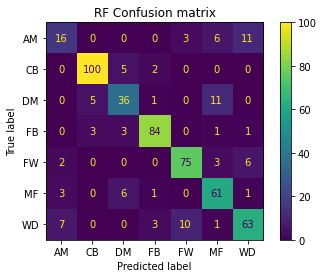

In [32]:
# plot confusion matrix
cm_rf = plot_confusion_matrix(rf, X_val, Y_val,
                              cmap='viridis',
                              normalize=None)

cm_rf.ax_.set_title('RF Confusion matrix');

## SVM GridSearch (Oversampled)

Using grid search, the SVC model for oversampled data was optimized by looking for its best hyperparameters. In this case, the best number of `C` value, type of `kernel` and best value for `gamma` was checked. After using grid search, the best hyperparameters chosen were `C=3, kernel=rbf, and gamma=scale`. This improved the accuracy of the model to `85.21%`.

In [33]:
# gridsearch for SVC model
svc = SVC(random_state=random_state)

c_values = [1.0, 2.0, 3.0] #[0.01, 0.1, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
kernel_values = ['rbf', 'linear'] #['linear', 'poly', 'rbf', 'sigmoid']
gamma = ['scale', 'auto'] #['scale', 'auto', 1.0, 0.1, 0.01, 0.001, 0.0001]

param_grid = dict(C=c_values, kernel=kernel_values, gamma=gamma)

skfold = StratifiedKFold(n_splits=5, shuffle=True, 
                         random_state=random_state)

grid_search = GridSearchCV(svc, param_grid, scoring='accuracy', cv=skfold)
svc_result = grid_search.fit(X_train_os, Y_train_os)

print("Best Accuracy: %f Best hyperparameter: %s" % (svc_result.best_score_,
                                                     svc_result.best_params_))

Best Accuracy: 0.852141 Best hyperparameter: {'C': 3.0, 'gamma': 'scale', 'kernel': 'rbf'}


Using the best hyperparameters, the model is again trained and then was used to predict the classifications of the holdout dataset. The `holdout accuracy` recorded was `81.50%`. Check the confusion matrix below to see how the prediction went. In this study, it is important to see how many were identified properly and also to see which other classes are mostly mistaken as the other. This is due to the overlapping nature of some of the positions.

In [34]:
# test top hyperparameters on hold out data
svc = SVC(C=3, kernel = 'rbf', random_state=random_state, gamma= 'scale')
svc.fit(X_train_os, Y_train_os)

svc_pred = svc.predict(X_val)

print("Holdout Accuracy: %f" % accuracy_score(Y_val, svc_pred))

Holdout Accuracy: 0.815094


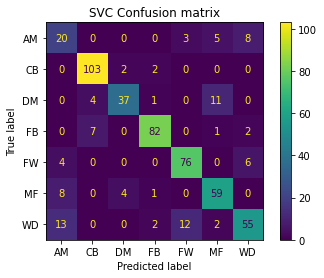

In [35]:
# plot confusion matrix
cm_svc = plot_confusion_matrix(svc, X_val, Y_val,
                               cmap='viridis',
                               normalize=None)

cm_svc.ax_.set_title('SVC Confusion matrix');

## RF GridSearch (Oversampled)

Using grid search, the RF model was optimized by looking for its best hyperparameter. In this case, the best number of `n_estimators` best value for `max_features`, and `max-depth` was checked. After using grid search, the best hyperparameters chosen were `max_depth=None, max_features=0.2, n_estimators=150`. This improved the accuracy of the model to `87.65%`.

In [36]:
# gridsearch for RF model
rf = RandomForestClassifier(random_state=random_state)

n_estimators = [100, 150, 200] #[50, 100, 150, 200]
max_features = [0.2, 0.4, 'auto'] #[0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
max_depth = [10, 15, None] #[1, 5, 10, 15, 20, 25, 30, 40, None]

param_grid = dict(n_estimators=n_estimators, max_features=max_features, 
                  max_depth=max_depth)

skfold = StratifiedKFold(n_splits=5, shuffle=True, 
                         random_state=random_state)

grid_search = GridSearchCV(rf, param_grid, scoring="accuracy", 
                           n_jobs=-1, cv=skfold)
rf_result = grid_search.fit(X_train_os, Y_train_os)

print("Best Accuracy: %f Best hyperparameter: %s" % (rf_result.best_score_,
                                                     rf_result.best_params_))

Best Accuracy: 0.876506 Best hyperparameter: {'max_depth': None, 'max_features': 0.2, 'n_estimators': 200}


Using the best hyperparameters, the model was again trained and then was used to predict the classifications of the holdout dataset. The `holdout accuracy` recorded was `82.64%`. Check the confusion matrix below to see how the prediction went. In this study, it is important to see how many were identified properly and also to see which other classes are mostly mistaken as the other. This is due to the overlapping nature of some of the positions.

In [37]:
# test top hyperparameters on hold out data
rf = RandomForestClassifier(n_estimators=150, max_features=0.2, 
                            max_depth= 15,
                            random_state=random_state)
rf.fit(X_train_os, Y_train_os)

rf_pred = rf.predict(X_val)

print("Holdout Accuracy: %f" % accuracy_score(Y_val, rf_pred))

Holdout Accuracy: 0.826415


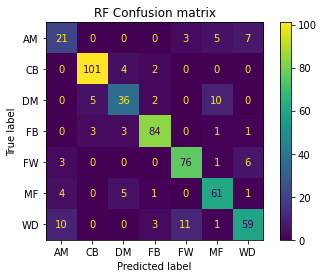

In [38]:
# plot confusion matrix
cm_rf = plot_confusion_matrix(rf, X_val, Y_val,
                              cmap='viridis',
                              normalize=None)

cm_rf.ax_.set_title('RF Confusion matrix');

## Results and Discussion

## Interpretability

The model that was used was the one with the highest hold-out accuracy which was the `Random Forest (SVM-SMOTE)` model. For this study, 2 methods, `SHAP and LIME`, were used to check the model's interpretability.

In [39]:
import shap

# compute SHAP values
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X)

The summary plot shows which features contributed or how much each feature impacted the outpiut classification. Some of the features that hugely impact most of the classes are defending, crossing and heading. 

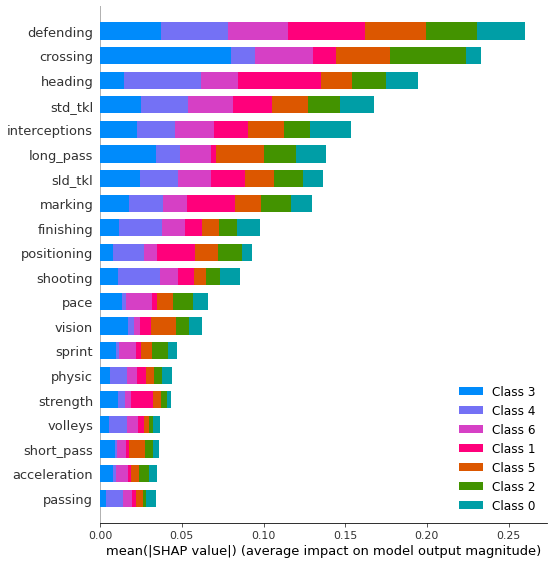

In [40]:
# summary plot
shap.summary_plot(shap_values = shap_values, 
                  features = X, 
                  plot_type="bar")

Meanwhile, the swarm plot below shows how the features impact the classification for a particular class and in this case that it Class 0 or Forwards. This shows that high defensive stats (defending, interceptions, tackling) usually impact the classification negatively which is in-line with common forward traits because they tend to be more offensively minded.

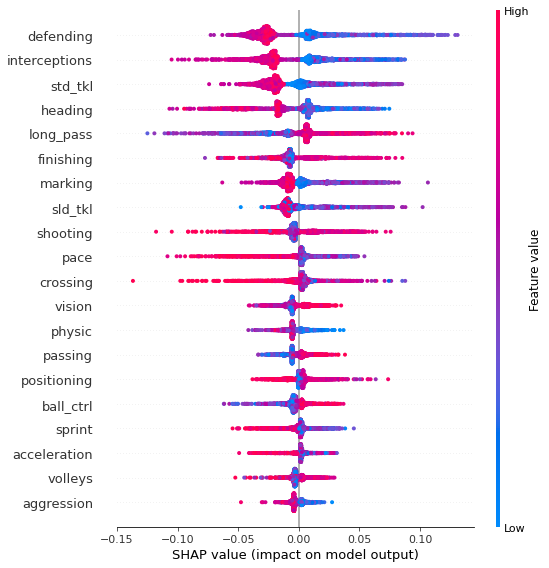

In [41]:
# swarm plot
shap.summary_plot(shap_values[0], X.values, feature_names = X.columns)

For local interpretability, I used LIME because when using SHAP, we need to see check a number of force plots corresponding to the number of classes in order to see the interpretation for one sample point. Meanwhile in LIME, we can check each sample point and see all of the needed informatiom all at once.

In [42]:
# import lime
import lime
from lime.lime_tabular import LimeTabularExplainer

# choose model
predictions = rf.predict(X_val)

# lime explainer
explainer = LimeTabularExplainer(np.array(X_train_os), 
                                 feature_names=list(X.columns),
                                 class_names=np.unique(Y_train_os),
                                 discretize_continuous=True)

The first example below is a Forward and it was correctly interpreted. We can also see on the prediction probabilies that shows that it could also be classified as a Wide Player. This is consistent with the possible position overlaps. Some Forwards also play as `left or right wings`, a specific type of wide player.

Meanwhile for the feature values, we can see the top features for overall classification and see if the values for each sample point is less, within or more than the set threshold for each feature. For example, the defending value is less than the defending cut off and the shooting value is more than the cutoff. These are consistent with the usual traits of forwards who are more offensive oriented. We can also see the impact of each feature value to the final classification as seen inthe small bars below the feature name, in this case all of them contribute to the FW classification thus are colred in purple.

In [43]:
# pick a sample
i = 4 #FW
exp = explainer.explain_instance(
    np.array(X_val)[i], 
    rf.predict_proba, 
    num_features=10, 
    top_labels=1)

exp.show_in_notebook()

Next example is a Fullback. Again, it was correctly predicted but it can be seen that it has a probability of being classified as a WD (wide player). Again this is consistent with the usual role of a fullback which is actually a `defensive wide player`. 

As for the features, we can see that some evaluations actually contribute to the possibility of classifiying the sample into a different class. Those features (defending) that can be seen under the 'Not FB' space are features that favor other classes rather than the FB class. But ultimatelty, the sum of the impacts for those towards a FB class (red) was still larger.

In [44]:
# pick a sample
i = 6 #FB
exp = explainer.explain_instance(
    np.array(X_val)[i], 
    rf.predict_proba, 
    num_features=10, 
    top_labels=1)

exp.show_in_notebook()

The next examples were also predicted correctly but with probabilities higher than 80%.

In [45]:
# pick first instance in the test dataset
i = 1 #CB
exp = explainer.explain_instance(
    np.array(X_val)[i], 
    rf.predict_proba, 
    num_features=10, 
    top_labels=1)

exp.show_in_notebook()

In [46]:
# pick a sample
i = 3 #MF
exp = explainer.explain_instance(
    np.array(X_val)[i], 
    rf.predict_proba, 
    num_features=10, 
    top_labels=1)

exp.show_in_notebook()

The examples below are wrongly identified, but if we look closely the misclassification is also due to known position overlaps like the DM class both the CB class (which are both defensive in nature) and the MF class (which are both passing oriented).

In [47]:
# pick a sample
i = 124 #CB
exp = explainer.explain_instance(
    np.array(X_val)[i], 
    rf.predict_proba, 
    num_features=10, 
    top_labels=1)

exp.show_in_notebook()

In [48]:
# pick a sample
i = 125 #DM
exp = explainer.explain_instance(
    np.array(X_val)[i], 
    rf.predict_proba, 
    num_features=10, 
    top_labels=1)

exp.show_in_notebook()

## Extra: MLP Classifier

An extra part of the study is to try and implement a basic sklearn MLP Classifier module for this problem. The default MLP parameters yielded an accuracy of `81.76%`.

In [49]:
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

from sklearn.neural_network import MLPClassifier

In [50]:
classifier = MLPClassifier()

In [51]:
skfold =  StratifiedKFold(n_splits=5, shuffle=True, 
                          random_state=random_state)
nn_results = cross_val_score(classifier, X_train_os, Y_train_os, 
                             cv=skfold, scoring=scoring)
print("%s: %.4f +/- %.2f" % ('MLP', nn_results.mean(), nn_results.std()))

MLP: 0.8218 +/- 0.01


Meanwhile after doing grid search, the accuracy increased to `82.64%` using the following paramters:

In [52]:
# gridsearch for MLP model
nn = MLPClassifier(random_state=random_state)

hidden_layer_sizes = [(100), (200,), (300,)] 
max_iter= [500, 1000]
activation = ['relu', 'logistic']
solver= ['adam']

param_grid = dict(hidden_layer_sizes=hidden_layer_sizes, max_iter=max_iter, 
                  activation=activation, solver=solver)

skfold = StratifiedKFold(n_splits=5, shuffle=True, 
                         random_state=random_state)

grid_search = GridSearchCV(nn, param_grid, scoring="accuracy", 
                           n_jobs=-1, cv=skfold)
nn_result = grid_search.fit(X_train, Y_train)

print("Best Accuracy: %f Best hyperparameter: %s" % (nn_result.best_score_, 
                                                     nn_result.best_params_))

Best Accuracy: 0.826415 Best hyperparameter: {'activation': 'logistic', 'hidden_layer_sizes': (300,), 'max_iter': 500, 'solver': 'adam'}


Using the best hyperparameters, the model was again trained and then was used to predict the classifications of the holdout dataset. The holdout accuracy recorded was 80.94%. Check the confusion matrix below to see how the prediction went.

In [53]:
classifier = MLPClassifier(hidden_layer_sizes=(300,), max_iter=500,
                           activation = 'logistic',
                           solver='adam',random_state=random_state)
classifier.fit(X_train_os, Y_train_os)

nn_pred = classifier.predict(X_val)

print("Holdout Accuracy: %f" % accuracy_score(Y_val, nn_pred))

Holdout Accuracy: 0.809434


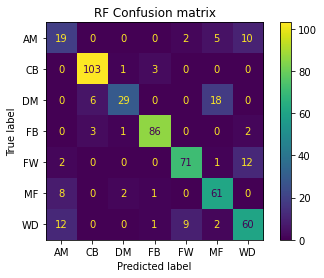

In [54]:
# plot confusion matrix
cm_nn = plot_confusion_matrix(classifier, X_val, Y_val,
                              cmap='viridis',
                              normalize=None)

cm_nn.ax_.set_title('RF Confusion matrix');

## Conclusion

Determining class imbalance in a multi-class classification problem can be challenging. Several metrics can be computed in order to determine the relative imbalance of the dataset like the Shannon Entropy.
<br>

Different methods addressing imbalance could also have a different effect depending on the dataset. In this case, although the dataset was determined as relatively balanced, oversampling methods were still able to help increase the model's accuracy. Also in some instances the opposite happens. In the study, addressing imbalance using the cost sensitive parameters did not improve the accuracy.
<br>

Interpretability depends on what insights you want to extract from the analysis. In the case of this study, it was better to use LIME because we wanted to explain the individual results. The possible position overlaps were shown in the prediction probabilties. These can help profile players and determine which other positions they could possibly play in. Meanwhile, the section where the feature's impact is shown could help in determining which particular ability the players need to improve on in order to be more efficient intheir current playing position.
<br>

A limited optimization of the MLP classifier was not able to beat the current accuracies from other models but if given a chance to increase the number of layers, the MLP classifier will be able to get a higher accuracy.
<br>

Rooms for improvement in this study can include increasing the sample size by including other leagues. Other oversampling/undersampling methods could also be used for the slight imbalance of the data. Meanwhile for the models, other models like XG Boost or AdaBoost could also be used. Hyperparameter optimization could also be improved by including more hyperparameters in our gridsearch.
<br>


## References

I would like to acknowledge my references for this study:

 - A General Measure of Data-set Imbalance (n.d), https://stats.stackexchange.com/questions/239973/a-general-measure-of-data-set-imbalance
 - Kaggle - FIFA 22 Complete Player Dataset (n.d), https://www.kaggle.com/stefanoleone992/fifa-22-complete-player-dataset
 - Kaggle - FIFA Player Predictor (n.d), https://www.kaggle.com/alokpandey0903/fifa-player-predictor/notebook
 - How to Improve Class Imbalance using Class Weights in Machine Learning https://www.analyticsvidhya.com/blog/2020/10/improve-class-imbalance-class-weights/
 - Local Surrogate (LIME) (n.d),
 https://christophm.github.io/interpretable-ml-book/lime.html
 - LIME vs. SHAP: Which is Better for Explaining Machine Learning Models? (n.d), https://towardsdatascience.com/lime-vs-shap-which-is-better-for-explaining-machine-learning-models-d68d8290bb16
 - A Beginner’s Guide To Scikit-Learn’s MLPClassifier (n.d), https://analyticsindiamag.com/a-beginners-guide-to-scikit-learns-mlpclassifier/
